# Two-Stage Object Segmenter Examples

This notebook demonstrates how to use the two-stage object segmenter that combines:
1. **GroundingDINO** - Label-based object detection
2. **SAM2** - Box-based object segmentation

We'll also show examples of using each component individually and then combining them with the TwoStageObjectSegmenter.


## Setup


In [1]:
import sys
sys.path.append('../..')

from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from core.predictors.impl.grounding_dino_object_detector import GroundingDinoObjectDetector
from core.predictors.impl.sam2_object_segmenter import Sam2ObjectSegmenter
from core.predictors.impl.two_stage_object_segmenter import TwoStageObjectSegmenter
from core.predictors.impl.lama_image_inpainter import LamaImageInpainter
from utils.image import expand_mask_image


c:\Users\nghia\miniconda3\envs\mic2e\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
c:\Users\nghia\miniconda3\envs\mic2e\lib\site-packages\timm\models\layers\__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


## Configuration


In [2]:
# File paths
IMAGE_PATH = "../images/pexels-photo-1108099.webp"
GROUNDING_DINO_CONFIG = "../../config/GroundingDINO_SwinT_OGC.py"
GROUNDING_DINO_WEIGHTS = "../weights/groundingdino_swint_ogc.pth"
SAM2_CONFIG = "../../config/sam2.1_hiera_1.yaml"
SAM2_WEIGHTS = "../weights/sam2.1_hiera_large.pt"
LAMA_WEIGHTS = "../weights/big-lama.pt"

# Detection parameters
TEXT_PROMPT = "dog"
DEVICE = "cuda"  # or "cpu"


## Load Image


Image size: (500, 375)


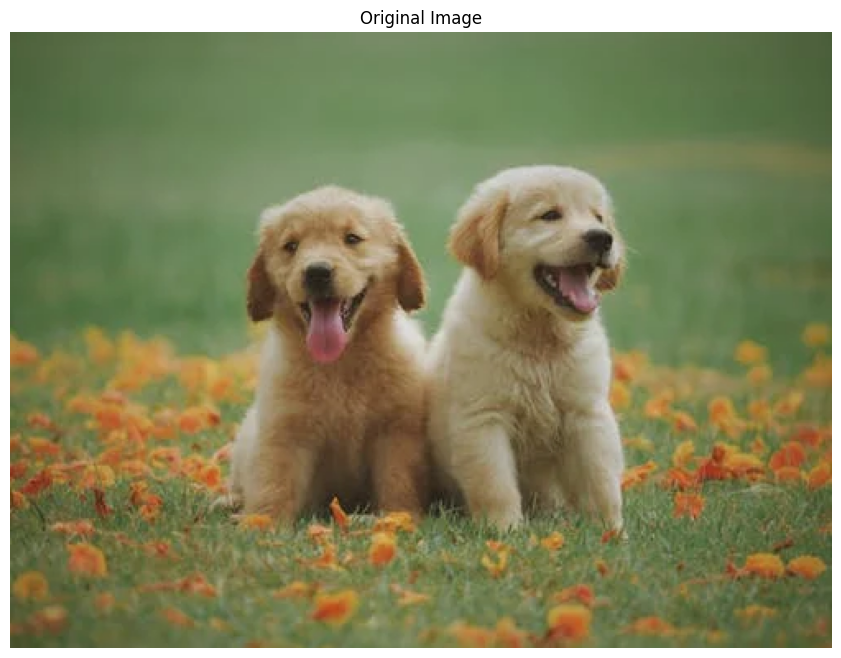

In [3]:
# Load the image
image = Image.open(IMAGE_PATH)
print(f"Image size: {image.size}")

# Display the image
plt.figure(figsize=(12, 8))
plt.imshow(image)
plt.title("Original Image")
plt.axis('off')
plt.show()


## Example 1: GroundingDINO Object Detector Only

First, let's use just the GroundingDINO detector to find objects by label.


In [4]:
# Initialize the detector
detector = GroundingDinoObjectDetector(
    checkpoint_path=GROUNDING_DINO_WEIGHTS,
    config_path=GROUNDING_DINO_CONFIG,
    box_threshold=0.35,
    text_threshold=0.25
)

# Load the model
detector.load(DEVICE)
print("GroundingDINO model loaded successfully!")


c:\Users\nghia\miniconda3\envs\mic2e\lib\site-packages\torch\functional.py:554: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\native\TensorShape.cpp:4316.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


final text_encoder_type: bert-base-uncased
GroundingDINO model loaded successfully!


c:\Users\nghia\miniconda3\envs\mic2e\lib\site-packages\transformers\modeling_utils.py:1625: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
c:\Users\nghia\miniconda3\envs\mic2e\lib\site-packages\torch\_dynamo\eval_frame.py:838: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.5 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  return fn(*args, **kwargs)
c:\Users\nghia\miniconda3\envs\mic2e\lib\site-packages\torch\utils\checkpoint.py:86: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(
c:\Users\nghia\miniconda3\envs\mic2e\lib\site-packages\groundingdino\models\GroundingDINO\transformer.py:862: FutureWarning: `t

Found 2 objects with label 'dog'
Object 1: dog, Score: 0.807, BBox: (251, 79, 376, 307)
Object 2: dog, Score: 0.813, BBox: (125, 92, 257, 306)


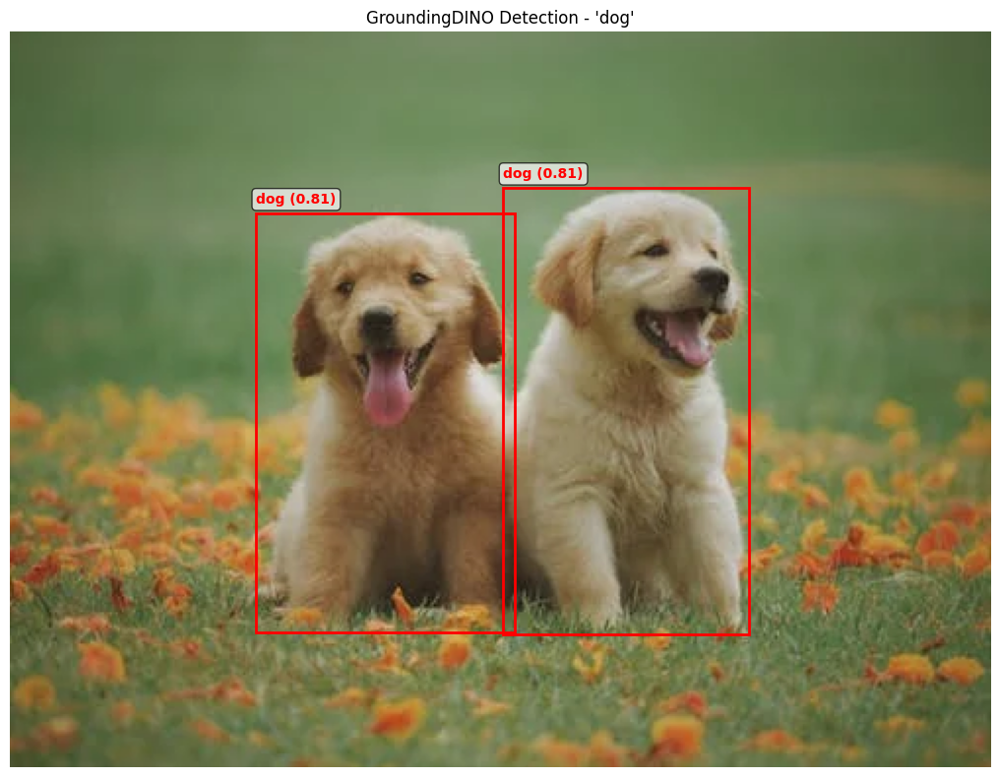

In [5]:
# Detect objects
detected_objects = detector.detect_with_label(image, TEXT_PROMPT)
print(f"Found {len(detected_objects)} objects with label '{TEXT_PROMPT}'")

# Display results
fig, ax = plt.subplots(figsize=(12, 8))
ax.imshow(image)

for i, obj in enumerate(detected_objects):
    xmin, ymin, xmax, ymax = obj.bbox
    width = xmax - xmin
    height = ymax - ymin
    
    # Draw bounding box
    rect = patches.Rectangle(
        (xmin, ymin), width, height,
        linewidth=2, edgecolor='red', facecolor='none'
    )
    ax.add_patch(rect)
    
    # Add label
    ax.text(
        xmin, ymin - 5,
        f"{obj.label} ({obj.score:.2f})",
        color='red', fontsize=10, fontweight='bold',
        bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.7)
    )
    print(f"Object {i+1}: {obj.label}, Score: {obj.score:.3f}, BBox: {obj.bbox}")

ax.set_title(f"GroundingDINO Detection - '{TEXT_PROMPT}'")
ax.axis('off')
plt.tight_layout()
plt.show()


## Example 2: SAM2 Box-Based Segmentation

Now let's use SAM2 to segment an object using a bounding box.


In [6]:
# Initialize the segmenter
segmenter = Sam2ObjectSegmenter(
    checkpoint_path=SAM2_WEIGHTS,
    config_path=SAM2_CONFIG
)

# Load the model
segmenter.load(DEVICE)
print("SAM2 model loaded successfully!")


SAM2 model loaded successfully!


Segmented 3 objects from the bounding box


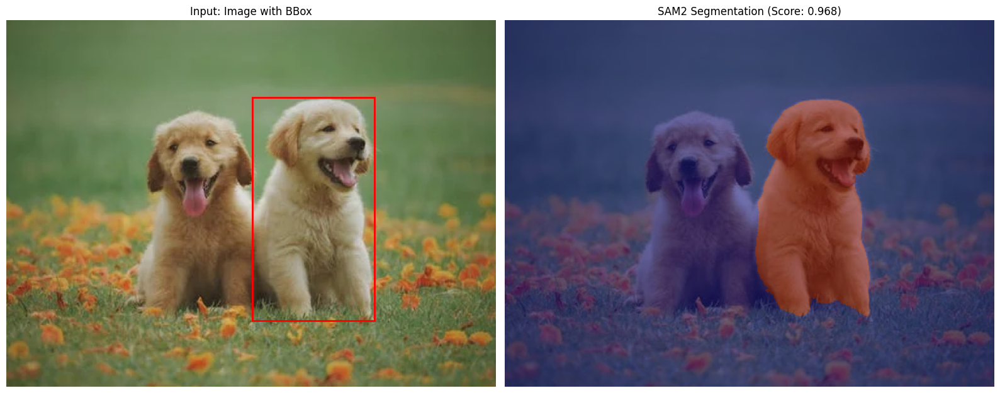

In [7]:
# Use the first detected object's bounding box for segmentation
if detected_objects:
    first_bbox = detected_objects[0].bbox
    segmented_objects = segmenter.segment_with_box(image, first_bbox)
    
    print(f"Segmented {len(segmented_objects)} objects from the bounding box")
    
    # Display results
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))
    
    # Original image with bbox
    axes[0].imshow(image)
    xmin, ymin, xmax, ymax = first_bbox
    rect = patches.Rectangle(
        (xmin, ymin), xmax - xmin, ymax - ymin,
        linewidth=2, edgecolor='red', facecolor='none'
    )
    axes[0].add_patch(rect)
    axes[0].set_title("Input: Image with BBox")
    axes[0].axis('off')
    
    # Segmentation mask
    if segmented_objects:
        mask = np.array(segmented_objects[0].mask)
        axes[1].imshow(image)
        axes[1].imshow(mask, alpha=0.5, cmap='jet')
        axes[1].set_title(f"SAM2 Segmentation (Score: {segmented_objects[0].score:.3f})")
        axes[1].axis('off')
    
    plt.tight_layout()
    plt.show()
else:
    print("No objects detected to segment!")


## Example 3: Two-Stage Object Segmenter

Now let's combine both models using the TwoStageObjectSegmenter for end-to-end label-based segmentation.


In [8]:
# First, unload the individual models to free up memory
detector.unload()
segmenter.unload()
print("Unloaded individual models")


Unloaded individual models


In [9]:
# Create new instances for the two-stage segmenter
detector = GroundingDinoObjectDetector(
    checkpoint_path=GROUNDING_DINO_WEIGHTS,
    config_path=GROUNDING_DINO_CONFIG,
    box_threshold=0.35,
    text_threshold=0.25
)

segmenter = Sam2ObjectSegmenter(
    checkpoint_path=SAM2_WEIGHTS,
    config_path=SAM2_CONFIG
)

# Initialize the two-stage segmenter
two_stage_segmenter = TwoStageObjectSegmenter(detector, segmenter)

# Load the models
two_stage_segmenter.load(DEVICE)
print("Two-stage segmenter loaded successfully!")


final text_encoder_type: bert-base-uncased
Two-stage segmenter loaded successfully!


In [10]:
# Segment objects by label
segmented_objects = two_stage_segmenter.segment_with_label(image, TEXT_PROMPT)
print(f"Found and segmented {len(segmented_objects)} objects with label '{TEXT_PROMPT}'")

for i, obj in enumerate(segmented_objects):
    print(f"Object {i+1}: {obj.label}, Score: {obj.score:.3f}, BBox: {obj.bbox}")


Found and segmented 2 objects with label 'dog'
Object 1: dog, Score: 0.887, BBox: (256, 81, 372, 302)
Object 2: dog, Score: 0.890, BBox: (135, 94, 252, 297)


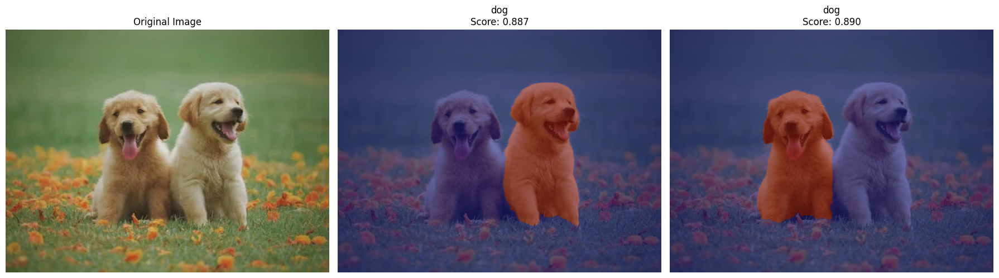

In [11]:
# Visualize all segmented objects
if segmented_objects:
    num_objects = len(segmented_objects)
    fig, axes = plt.subplots(1, num_objects + 1, figsize=(6 * (num_objects + 1), 6))
    
    if num_objects == 1:
        axes = [axes[0], axes[1]] if hasattr(axes, '__iter__') else [axes]
    
    # Original image
    axes[0].imshow(image)
    axes[0].set_title("Original Image")
    axes[0].axis('off')
    
    # Each segmented object
    for i, obj in enumerate(segmented_objects):
        mask = np.array(obj.mask)
        axes[i + 1].imshow(image)
        axes[i + 1].imshow(mask, alpha=0.5, cmap='jet')
        axes[i + 1].set_title(f"{obj.label}\nScore: {obj.score:.3f}")
        axes[i + 1].axis('off')
    
    plt.tight_layout()
    plt.show()
else:
    print("No objects found!")


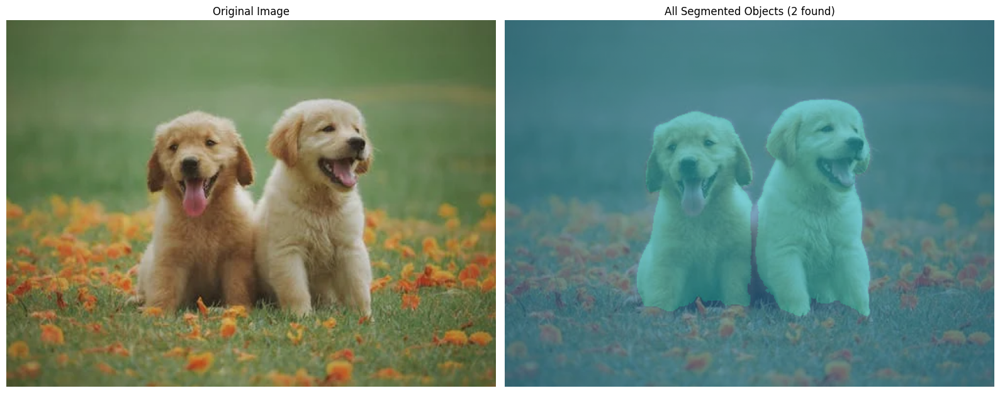

In [12]:
# Visualize all masks combined
if segmented_objects:
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))
    
    # Original image
    axes[0].imshow(image)
    axes[0].set_title("Original Image")
    axes[0].axis('off')
    
    # Combined masks
    axes[1].imshow(image)
    combined_mask = np.zeros((image.height, image.width))
    for i, obj in enumerate(segmented_objects):
        mask = np.array(obj.mask)
        combined_mask += mask * (i + 1)
    
    axes[1].imshow(combined_mask, alpha=0.5, cmap='tab10')
    axes[1].set_title(f"All Segmented Objects ({len(segmented_objects)} found)")
    axes[1].axis('off')
    
    plt.tight_layout()
    plt.show()


## Example 4: Try Different Labels


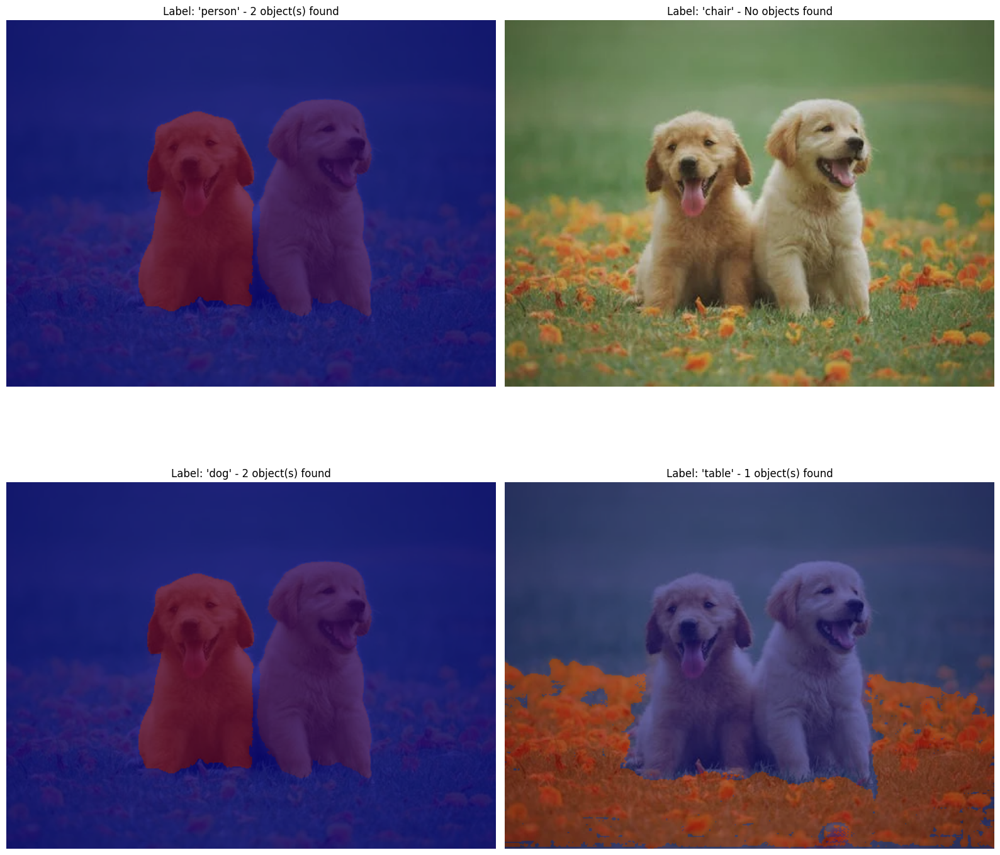

In [13]:
# Try different labels
test_labels = ["person", "chair", "dog", "table"]

fig, axes = plt.subplots(2, 2, figsize=(16, 16))
axes = axes.flatten()

for i, label in enumerate(test_labels):
    segmented = two_stage_segmenter.segment_with_label(image, label)
    
    axes[i].imshow(image)
    
    if segmented:
        for obj in segmented:
            mask = np.array(obj.mask)
            axes[i].imshow(mask, alpha=0.5, cmap='jet')
        axes[i].set_title(f"Label: '{label}' - {len(segmented)} object(s) found")
    else:
        axes[i].set_title(f"Label: '{label}' - No objects found")
    
    axes[i].axis('off')

plt.tight_layout()
plt.show()


## Example 5: LaMa Inpainting with Two-Stage Segmentation

Let's use the segmentation masks with LaMa to remove objects from the image.


In [14]:
# Initialize LaMa inpainter
inpainter = LamaImageInpainter(model_path=LAMA_WEIGHTS)
inpainter.load(DEVICE)
print("LaMa model loaded successfully!")


LaMa model loaded successfully!


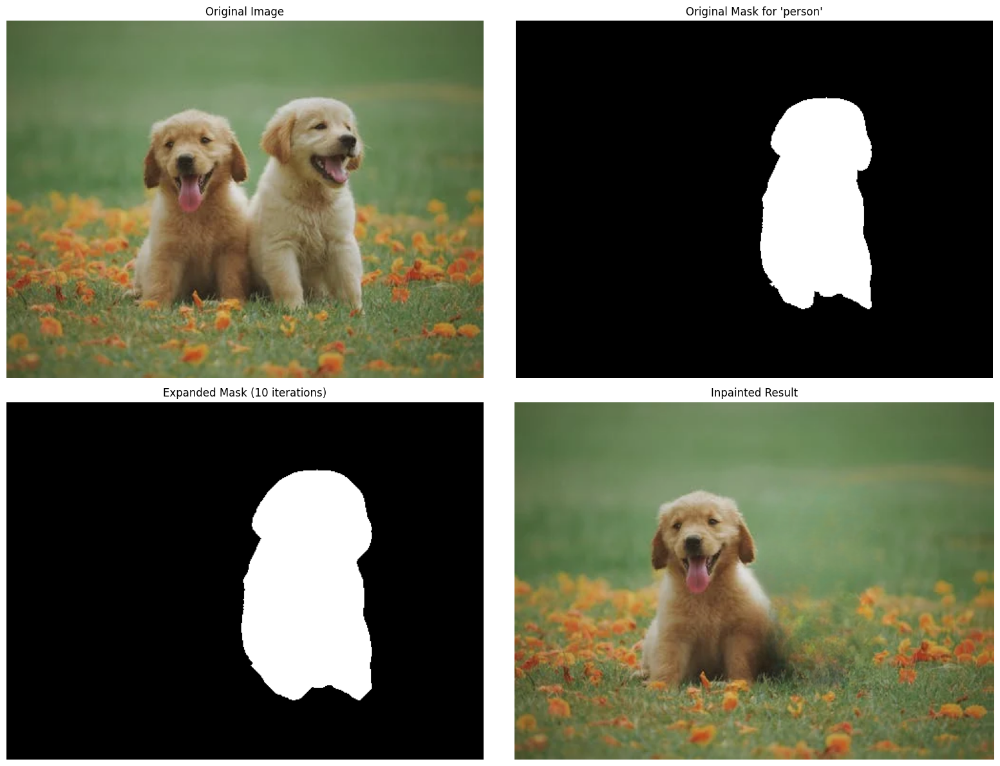

In [15]:
# Segment and inpaint a specific label
target_label = "person"
segmented = two_stage_segmenter.segment_with_label(image, target_label)

if segmented:
    # Use the first segmented object's mask
    mask = segmented[0].mask
    
    # Expand the mask slightly for better inpainting results
    # This ensures we cover the entire object including edges
    expanded_mask = expand_mask_image(mask, iterations=10)
    
    # Inpaint the image with expanded mask
    inpainted_image = inpainter.inpaint_with_mask(image, expanded_mask)
    
    # Display results
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    
    axes[0, 0].imshow(image)
    axes[0, 0].set_title("Original Image")
    axes[0, 0].axis('off')
    
    axes[0, 1].imshow(mask, cmap='gray')
    axes[0, 1].set_title(f"Original Mask for '{target_label}'")
    axes[0, 1].axis('off')
    
    axes[1, 0].imshow(expanded_mask, cmap='gray')
    axes[1, 0].set_title("Expanded Mask (10 iterations)")
    axes[1, 0].axis('off')
    
    axes[1, 1].imshow(inpainted_image)
    axes[1, 1].set_title("Inpainted Result")
    axes[1, 1].axis('off')
    
    plt.tight_layout()
    plt.show()
else:
    print(f"No objects found with label '{target_label}'")


### Comparison: Original Mask vs Expanded Mask for Inpainting

Let's compare the inpainting results with and without mask expansion.


C:\Users\nghia\AppData\Local\Temp\ipykernel_24856\2141934304.py:40: UserWarning: Glyph 10024 (\N{SPARKLES}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
c:\Users\nghia\miniconda3\envs\mic2e\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 10024 (\N{SPARKLES}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


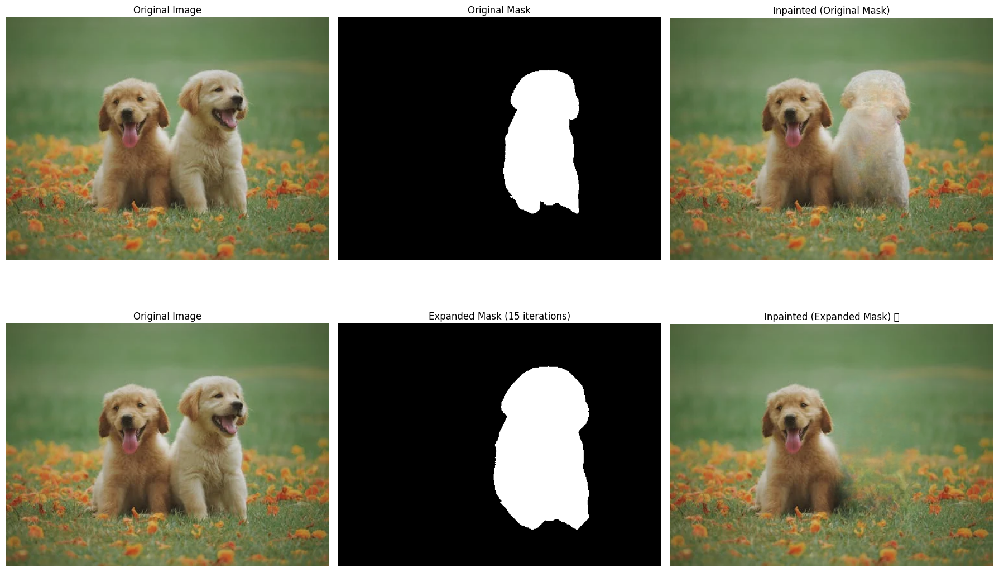

Note: The expanded mask typically produces better results by covering object edges completely.


In [16]:
if segmented:
    mask = segmented[0].mask
    
    # Inpaint with original mask
    inpainted_original = inpainter.inpaint_with_mask(image, mask)
    
    # Inpaint with expanded mask
    expanded_mask = expand_mask_image(mask, iterations=15)
    inpainted_expanded = inpainter.inpaint_with_mask(image, expanded_mask)
    
    # Display comparison
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    
    # Row 1: Original mask workflow
    axes[0, 0].imshow(image)
    axes[0, 0].set_title("Original Image")
    axes[0, 0].axis('off')
    
    axes[0, 1].imshow(mask, cmap='gray')
    axes[0, 1].set_title("Original Mask")
    axes[0, 1].axis('off')
    
    axes[0, 2].imshow(inpainted_original)
    axes[0, 2].set_title("Inpainted (Original Mask)")
    axes[0, 2].axis('off')
    
    # Row 2: Expanded mask workflow
    axes[1, 0].imshow(image)
    axes[1, 0].set_title("Original Image")
    axes[1, 0].axis('off')
    
    axes[1, 1].imshow(expanded_mask, cmap='gray')
    axes[1, 1].set_title("Expanded Mask (15 iterations)")
    axes[1, 1].axis('off')
    
    axes[1, 2].imshow(inpainted_expanded)
    axes[1, 2].set_title("Inpainted (Expanded Mask) ✨")
    axes[1, 2].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print("Note: The expanded mask typically produces better results by covering object edges completely.")


## Example 6: Point-Based Segmentation with SAM2

SAM2 also supports point-based segmentation.


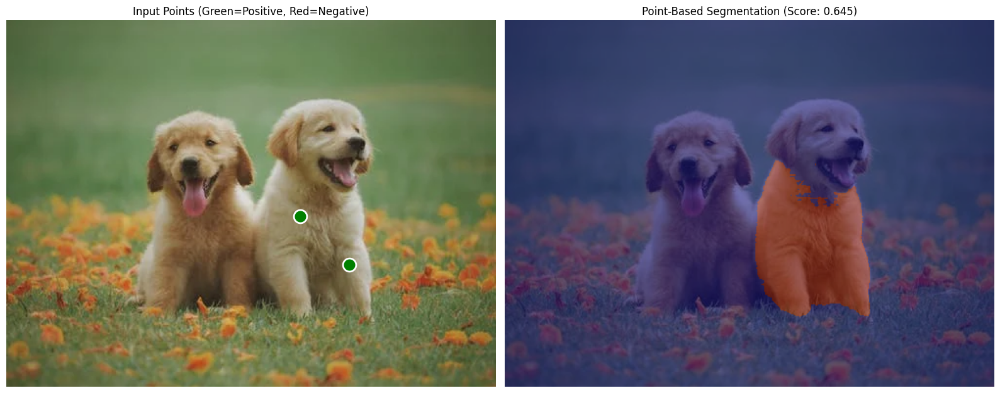

In [17]:
# Define points (x, y coordinates)
# Positive points indicate what you want to segment
# Negative points indicate what you want to exclude
positive_points = [(300, 200), (350, 250)]  # Adjust based on your image
negative_points = []

# Segment using points
point_segments = segmenter.segment_with_points(image, positive_points, negative_points)

if point_segments:
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))
    
    # Original image with points
    axes[0].imshow(image)
    for px, py in positive_points:
        axes[0].plot(px, py, 'go', markersize=15, markeredgewidth=2, markeredgecolor='white')
    for nx, ny in negative_points:
        axes[0].plot(nx, ny, 'ro', markersize=15, markeredgewidth=2, markeredgecolor='white')
    axes[0].set_title("Input Points (Green=Positive, Red=Negative)")
    axes[0].axis('off')
    
    # Segmentation result
    mask = np.array(point_segments[0].mask)
    axes[1].imshow(image)
    axes[1].imshow(mask, alpha=0.5, cmap='jet')
    axes[1].set_title(f"Point-Based Segmentation (Score: {point_segments[0].score:.3f})")
    axes[1].axis('off')
    
    plt.tight_layout()
    plt.show()
else:
    print("No segments found!")


## Cleanup

Unload all models to free up GPU memory.


In [18]:
two_stage_segmenter.unload()
inpainter.unload()
print("All models unloaded successfully!")

All models unloaded successfully!


## Summary

This notebook demonstrated:

1. **GroundingDINO Object Detector** - Detect objects using text labels
2. **SAM2 Object Segmenter** - Segment objects using bounding boxes or points
3. **Two-Stage Object Segmenter** - Combine detection and segmentation for label-based segmentation
4. **LaMa Inpainter** - Remove objects from images using segmentation masks
5. **Mask Expansion** - Dilate masks for better inpainting results

The two-stage approach provides a powerful pipeline for:
- Finding objects by natural language descriptions
- Obtaining precise segmentation masks
- Expanding masks to cover object boundaries completely
- Enabling downstream tasks like inpainting, editing, and analysis

### Key Takeaways:
- **Mask expansion** is crucial for high-quality inpainting - it ensures complete object removal without edge artifacts
- The `expand_mask_image()` function uses morphological dilation to grow masks by a specified number of iterations
- Typical iteration values range from 5-20 depending on the object size and desired expansion
